In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install datasets evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.2/491.2 kB 30.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 18.6 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2025.3.2
    Uninstalling fsspec-2025.3.2:
      Successfully uninstalled fsspec-2025.3.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2025.3.2 requires fsspec==2025.3.2, but you have fsspec 2024.12.0 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" an

In [ ]:
import transformers
print(transformers.__version__)


4.51.3


In [ ]:
import torch
from torch.utils.data import DataLoader
from datasets import load_from_disk, DatasetDict
from transformers import AutoImageProcessor, AutoModelForImageClassification, TrainingArguments, Trainer
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize, InterpolationMode
import evaluate

In [ ]:
# check device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [ ]:
save_path = '/content/drive/MyDrive/Multi_Modal/Project/input_demo'

from datasets import load_from_disk
# Load the dataset from the saved path
ds = load_from_disk(save_path)['train']  # returns just a Dataset

print(ds)

Dataset({
    features: ['title', 'artist', 'date', 'genre', 'style', 'description', 'filename', 'image', 'resnet50_non_robust_features_2048', 'resnet50_robust_features_2048', 'resnet50_robust_feats', 'resnet50_non_robust_feats'],
    num_rows: 8167
})


In [ ]:
ds = ds.class_encode_column("style")

In [ ]:
# Split the dataset
ds = ds.shuffle(seed=42)
ds = ds.train_test_split(test_size=0.3, seed=76)
val_test_split = ds["test"].train_test_split(test_size=0.5, seed=67)

final_ds = DatasetDict({
    "train": ds["train"],
    "validation": val_test_split["train"],
    "test": val_test_split["test"]
})

In [ ]:
# Image transform using processor
processor = AutoImageProcessor.from_pretrained("facebook/deit-tiny-patch16-224")

def transform(example):
    # Use Hugging Face processor, which handles resizing etc.
    example["pixel_values"] = processor(example["image"], return_tensors="pt")["pixel_values"].squeeze(0)
    return example

final_ds = final_ds.with_transform(transform)

def collate_fn(batch):
    pixel_values = torch.stack([x["pixel_values"] for x in batch])
    labels = torch.tensor([x["style"] for x in batch])  # Class-encoded already
    return {"pixel_values": pixel_values, "labels": labels}


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.6k [00:00<?, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


In [ ]:
# Prepare label mappings
style_names = final_ds['train'].features['style'].names
id2label = {i: name for i, name in enumerate(style_names)}
label2id = {name: i for i, name in enumerate(style_names)}

In [ ]:
# Load model
# processor = AutoImageProcessor.from_pretrained("facebook/deit-tiny-patch16-224")
model = AutoModelForImageClassification.from_pretrained(
    "facebook/deit-tiny-patch16-224",
    num_labels=len(style_names),
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)

pytorch_model.bin:   0%|          | 0.00/23.0M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at facebook/deit-tiny-patch16-224 and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([1000, 192]) in the checkpoint and torch.Size([23, 192]) in the model instantiated
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([23]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
from transformers import TrainingArguments

training_args = TrainingArguments(
    output_dir="./deit-wikiart",
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    do_eval=True,
    logging_steps=20,
    logging_dir="./logs",
    report_to="tensorboard",
    num_train_epochs=5,
    save_total_limit=1,
    remove_unused_columns=False
)


In [ ]:
# Accuracy metric
accuracy = evaluate.load("accuracy")
def compute_metrics(p):
    preds = p.predictions.argmax(-1)
    return accuracy.compute(predictions=preds, references=p.label_ids)


In [ ]:
# Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=final_ds["train"],
    eval_dataset=final_ds["validation"],
    tokenizer=processor,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
)

trainer.train()

<ipython-input-24-169cf8028c40>:2: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Step,Training Loss
20,2.914800
40,2.693000
60,2.607900
80,2.534200
100,2.308700
120,2.368500
140,2.208500
160,2.270500
180,2.145000
200,1.918200


TrainOutput(global_step=895, training_loss=1.538364855803591, metrics={'train_runtime': 360.2389, 'train_samples_per_second': 79.336, 'train_steps_per_second': 2.484, 'total_flos': 1.427137988032512e+17, 'train_loss': 1.538364855803591, 'epoch': 5.0})

In [ ]:
# Final test accuracy
test_results = trainer.evaluate(final_ds["test"])
print("✅ Test Accuracy:", test_results["eval_accuracy"])

✅ Test Accuracy: 0.40375203915171287


In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./logs


<IPython.core.display.Javascript object>

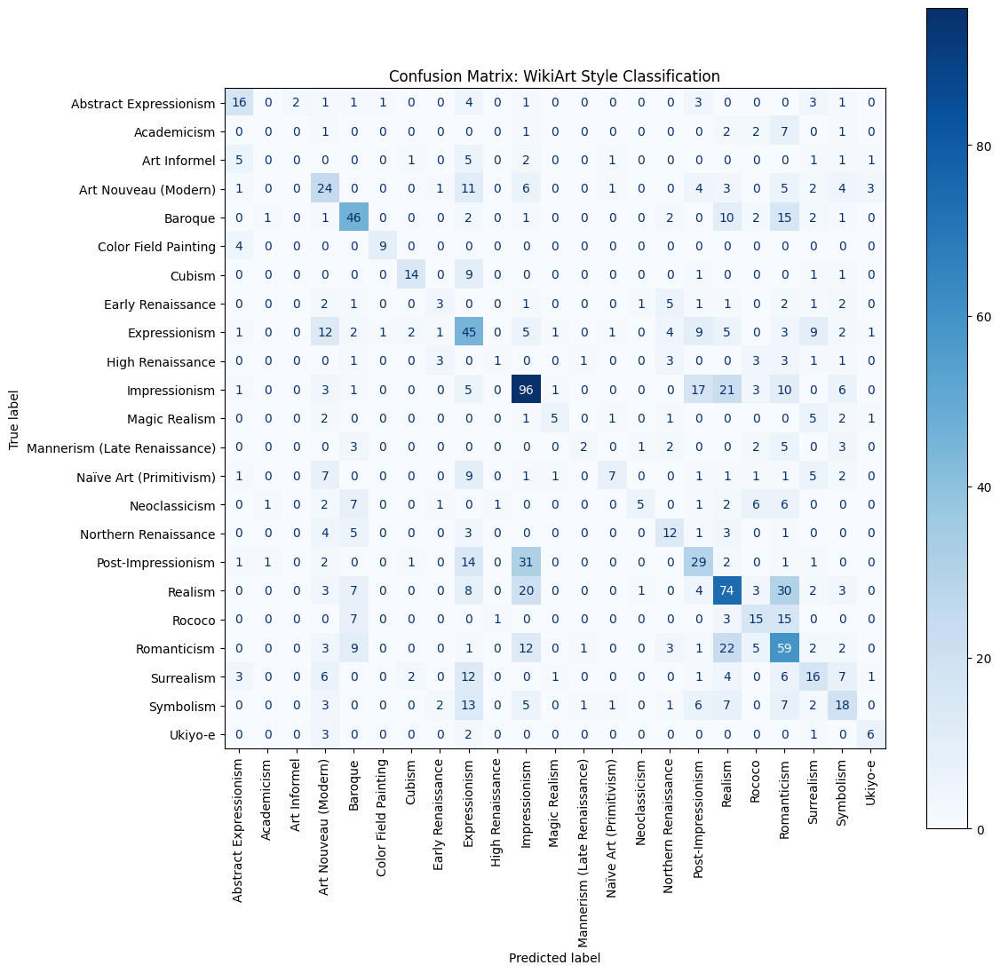

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
# Predict on test set
predictions = trainer.predict(final_ds["test"])
y_true = predictions.label_ids
y_pred = predictions.predictions.argmax(axis=-1)

# Confusion matrix with labels
labels = [final_ds["test"].features["style"].int2str(i) for i in range(len(style_names))]
cm = confusion_matrix(y_true, y_pred)

# Plot
fig, ax = plt.subplots(figsize=(12, 12))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(xticks_rotation=90, ax=ax, cmap='Blues')
plt.title("Confusion Matrix: WikiArt Style Classification")
plt.show()


## ResNet 50

In [ ]:
# Prepare imports
import torch
from datasets import load_from_disk, DatasetDict
from transformers import AutoImageProcessor, AutoModelForImageClassification, TrainingArguments, Trainer
import evaluate
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay



# Load processor
processor = AutoImageProcessor.from_pretrained("microsoft/resnet-50")

# Define transform
def transform(example):
    example["pixel_values"] = processor(example["image"], return_tensors="pt")["pixel_values"].squeeze(0)
    return example

final_ds = final_ds.with_transform(transform)

def collate_fn(batch):
    pixel_values = torch.stack([x["pixel_values"] for x in batch])
    labels = torch.tensor([x["style"] for x in batch])
    return {"pixel_values": pixel_values, "labels": labels}

# Prepare label mappings
style_names = final_ds['train'].features['style'].names
id2label = {i: name for i, name in enumerate(style_names)}
label2id = {name: i for i, name in enumerate(style_names)}




/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/266 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [ ]:
# Load ResNet-50 model
model = AutoModelForImageClassification.from_pretrained(
    "microsoft/resnet-50",
    num_labels=len(style_names),
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)

# TrainingArguments
training_args = TrainingArguments(
    output_dir="./resnet-wikiart",
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    do_eval=True,
    logging_steps=20,
    logging_dir="./logs_resnet",
    report_to="tensorboard",
    num_train_epochs=5,
    save_total_limit=1,
    remove_unused_columns=False,
)

# Define compute_metrics
accuracy = evaluate.load("accuracy")

def compute_metrics(p):
    preds = p.predictions.argmax(-1)
    return accuracy.compute(predictions=preds, references=p.label_ids)

config.json:   0%|          | 0.00/69.6k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of ResNetForImageClassification were not initialized from the model checkpoint at microsoft/resnet-50 and are newly initialized because the shapes did not match:
- classifier.1.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([23]) in the model instantiated
- classifier.1.weight: found shape torch.Size([1000, 2048]) in the checkpoint and torch.Size([23, 2048]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# Setup Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=final_ds["train"],
    eval_dataset=final_ds["validation"],
    tokenizer=processor,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
)

# Train
trainer.train()

<ipython-input-10-fe86973d7945>:2: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Step,Training Loss
20,3.123100
40,3.060700
60,3.015400
80,2.985900
100,2.917700
120,2.893800
140,2.858400
160,2.823600
180,2.783800
200,2.737400


TrainOutput(global_step=895, training_loss=2.680938405297988, metrics={'train_runtime': 496.929, 'train_samples_per_second': 57.513, 'train_steps_per_second': 1.801, 'total_flos': 6.08018517813289e+17, 'train_loss': 2.680938405297988, 'epoch': 5.0})

In [ ]:
# Final test evaluation
test_results = trainer.evaluate(final_ds["test"])
print("✅ Test Accuracy:", test_results["eval_accuracy"])

✅ Test Accuracy: 0.19412724306688417


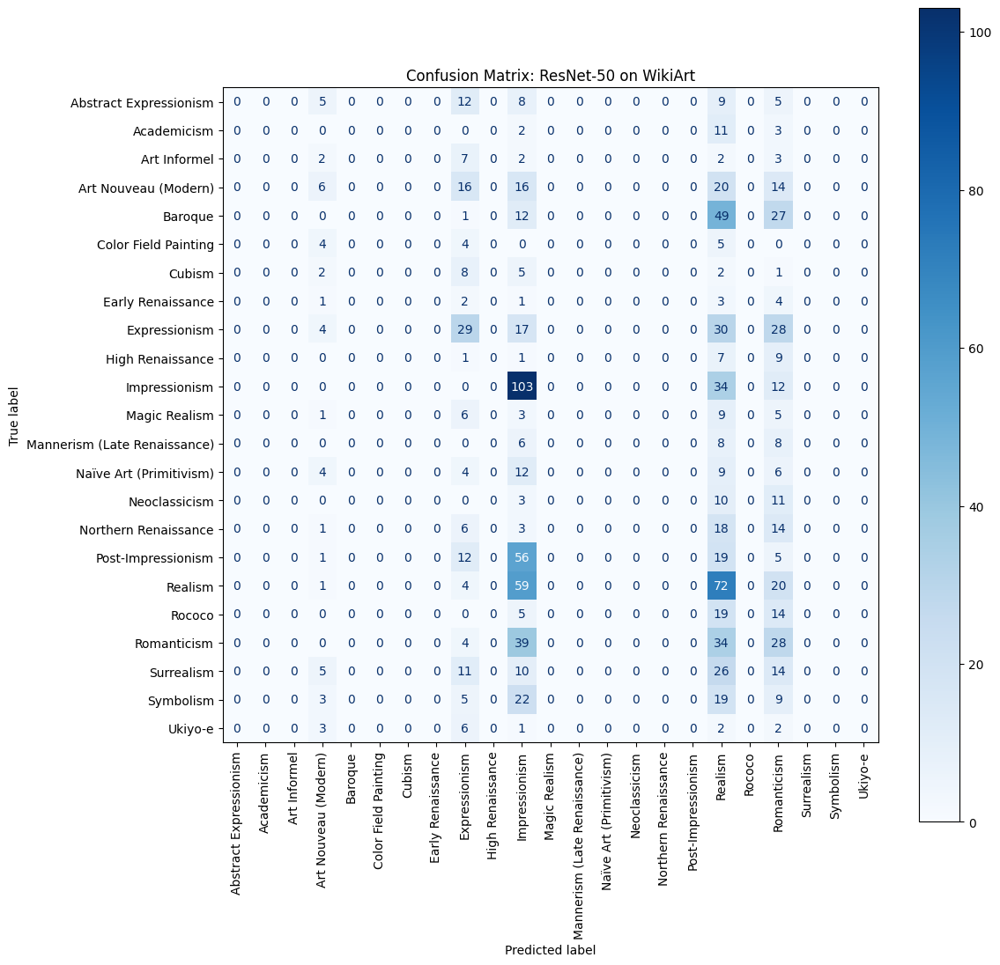

In [ ]:
# Confusion matrix
predictions = trainer.predict(final_ds["test"])
y_true = predictions.label_ids
y_pred = predictions.predictions.argmax(axis=-1)

labels = [final_ds["test"].features["style"].int2str(i) for i in range(len(style_names))]
cm = confusion_matrix(y_true, y_pred)

fig, ax = plt.subplots(figsize=(12, 12))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(xticks_rotation=90, ax=ax, cmap='Blues')
plt.title("Confusion Matrix: ResNet-50 on WikiArt")
plt.show()

## Find two images in test dataset

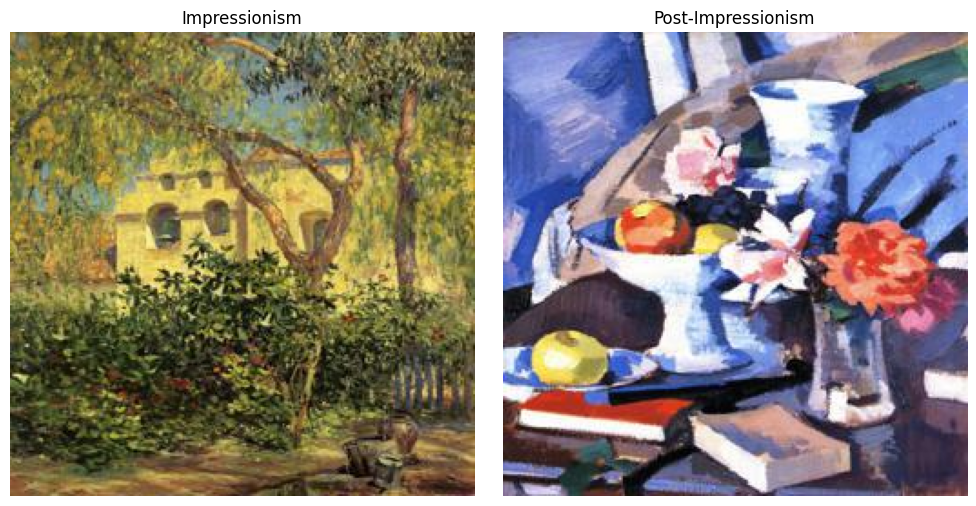

In [ ]:
import matplotlib.pyplot as plt

# Convert all styles in the test set
all_styles = [final_ds["test"].features["style"].int2str(label) for label in final_ds["test"]["style"]]

# Get indices
impressionism_idx = next(i for i, style in enumerate(all_styles) if style == "Impressionism")
post_impressionism_idx = next(i for i, style in enumerate(all_styles) if style == "Post-Impressionism")

# Fetch examples
impressionism_example = final_ds["test"][impressionism_idx]
post_impressionism_example = final_ds["test"][post_impressionism_idx]

# Plot them
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(impressionism_example["image"])
axes[0].set_title("Impressionism")
axes[0].axis("off")

axes[1].imshow(post_impressionism_example["image"])
axes[1].set_title("Post-Impressionism")
axes[1].axis("off")

plt.tight_layout()
plt.show()


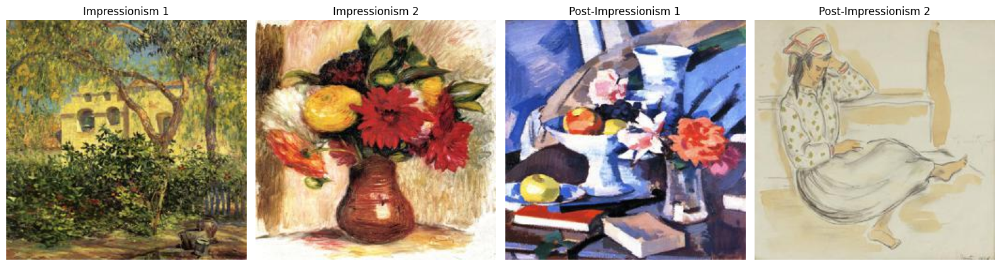

In [ ]:
import matplotlib.pyplot as plt

# Find indices where style matches
all_styles = [final_ds["test"].features["style"].int2str(label) for label in final_ds["test"]["style"]]

# Get two indices for each style
impressionism_indices = [i for i, style in enumerate(all_styles) if style == "Impressionism"][:2]
post_impressionism_indices = [i for i, style in enumerate(all_styles) if style == "Post-Impressionism"][:2]

# Fetch examples
examples = [final_ds["test"][idx] for idx in (impressionism_indices + post_impressionism_indices)]
titles = ["Impressionism 1", "Impressionism 2", "Post-Impressionism 1", "Post-Impressionism 2"]

# Plot them
fig, axes = plt.subplots(1, 4, figsize=(16, 5))  # 1 row, 4 columns

for ax, example, title in zip(axes, examples, titles):
    ax.imshow(example["image"])
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()
